In [1]:
import cv2               as cv
import numpy             as np
import pandas            as pd
import seaborn           as sns
import matplotlib.pyplot as plt
import urllib
import random
import os
import glob
import shutil
import visualkeras
from imutils               import paths
from sklearn.utils         import shuffle
from urllib.request        import urlopen
from sklearn.decomposition import PCA
from IPython.display       import Image
from tqdm                  import tqdm
from PIL                   import Image
import warnings
warnings.filterwarnings("ignore")

from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.models              import Sequential, load_model
from tensorflow.keras.preprocessing       import image
from tensorflow.keras.utils               import to_categorical, plot_model
from tensorflow.keras.callbacks           import ModelCheckpoint,EarlyStopping
from tensorflow.keras.layers              import Conv2D,Flatten,MaxPooling2D,Dense,Dropout,SpatialDropout2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator,img_to_array,load_img,array_to_img
from keras.layers                         import BatchNormalization, GlobalAveragePooling2D

Data set link:  [Kaggle](https://www.kaggle.com/datasets/vencerlanz09/sea-animals-image-dataste/data)

There were some duplicated images problem. This issue has been fixed with the following code; [Kaggle NoteBook](https://www.kaggle.com/code/gpiosenka/issues-with-sea-animals-dataset/notebook)

# 1-) Data Preparation

Data Preprocessing + Data Augmentation

In [2]:
folder_path        = "Dataset"
target_size        = (300,300)
labels_sea_animals = {"Clams"          :0,
                      "Corals"         :1,
                      "Crabs"          :2,
                      "Dolphin"        :3,
                      "Eel"            :4,
                      "Fish"           :5,
                      "Jelly_Fish"     :6,
                      "Lobster"        :7,
                      "Nudibranchs"    :8,
                      "Octopus"        :9,
                      "Otter"          :10,
                      "Penguin"        :11,
                      "Puffers"        :12,
                      "Sea_Rays"       :13,
                      "Sea_Urchins"    :14,
                      "Seahorse"       :15,
                      "Seal"           :16,
                      "Sharks"         :17,
                      "Shrimp"         :18,
                      "Squid"          :19,
                      "Starfish"       :20,
                      "Turtle_Tortoise":21,
                      "Whale"          :22}
labels_sea_animals_reversed = {value:key for key, value in labels_sea_animals.items()}
print(labels_sea_animals)
print(labels_sea_animals_reversed)

{'Clams': 0, 'Corals': 1, 'Crabs': 2, 'Dolphin': 3, 'Eel': 4, 'Fish': 5, 'Jelly_Fish': 6, 'Lobster': 7, 'Nudibranchs': 8, 'Octopus': 9, 'Otter': 10, 'Penguin': 11, 'Puffers': 12, 'Sea_Rays': 13, 'Sea_Urchins': 14, 'Seahorse': 15, 'Seal': 16, 'Sharks': 17, 'Shrimp': 18, 'Squid': 19, 'Starfish': 20, 'Turtle_Tortoise': 21, 'Whale': 22}
{0: 'Clams', 1: 'Corals', 2: 'Crabs', 3: 'Dolphin', 4: 'Eel', 5: 'Fish', 6: 'Jelly_Fish', 7: 'Lobster', 8: 'Nudibranchs', 9: 'Octopus', 10: 'Otter', 11: 'Penguin', 12: 'Puffers', 13: 'Sea_Rays', 14: 'Sea_Urchins', 15: 'Seahorse', 16: 'Seal', 17: 'Sharks', 18: 'Shrimp', 19: 'Squid', 20: 'Starfish', 21: 'Turtle_Tortoise', 22: 'Whale'}


In [3]:
#Data
for class_name in os.listdir(folder_path):
    print("Number of " , class_name , " is " , len(os.listdir(os.path.join(folder_path, class_name))))

Number of  Clams  is  497
Number of  Corals  is  495
Number of  Crabs  is  496
Number of  Dolphin  is  774
Number of  Eel  is  493
Number of  Fish  is  478
Number of  Jelly_Fish  is  845
Number of  Lobster  is  498
Number of  Nudibranchs  is  500
Number of  Octopus  is  557
Number of  Otter  is  496
Number of  Penguin  is  481
Number of  Puffers  is  524
Number of  Seahorse  is  476
Number of  Seal  is  411
Number of  Sea_Rays  is  514
Number of  Sea_Urchins  is  575
Number of  Sharks  is  584
Number of  Shrimp  is  486
Number of  Squid  is  478
Number of  Starfish  is  495
Number of  Turtle_Tortoise  is  1902
Number of  Whale  is  530


In [4]:
#Examine Data

def print_data(class_name, dataset, numOfImages=4):
    class_dir=os.path.join(dataset, class_name)
    images = os.listdir(class_dir)[:numOfImages]
    plt.figure(figsize=(15,30))
    for i, img_name in enumerate(images):
        img_path = os.path.join(class_dir, img_name)
        img=Image.open(img_path)
        plt.subplot(1, numOfImages, i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(class_name)
    plt.show()

0


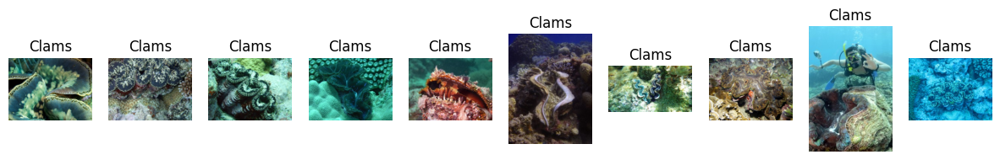

1


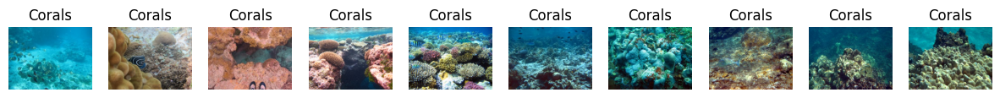

2


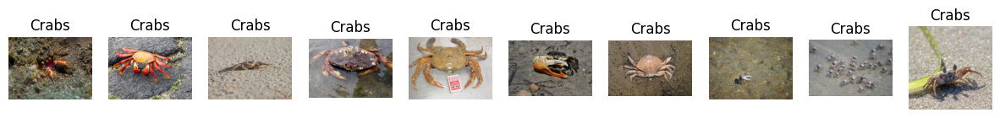

3


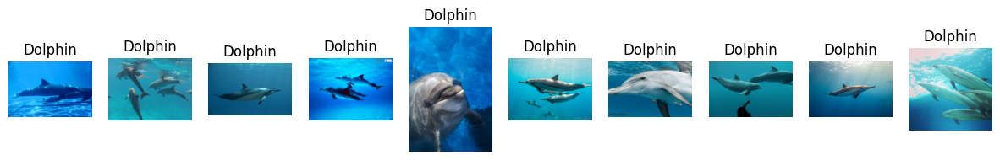

4


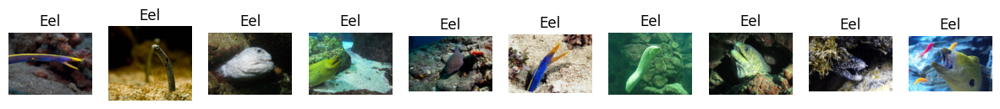

5


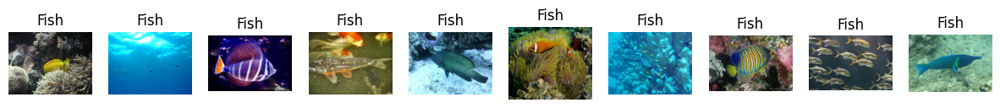

6


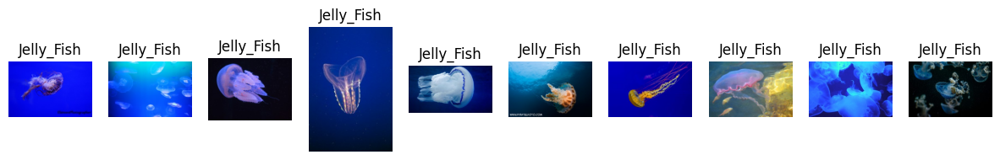

7


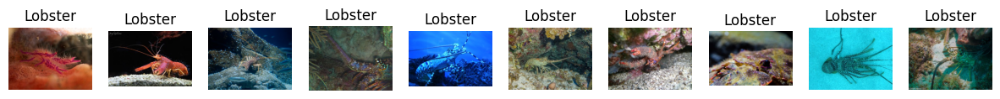

8


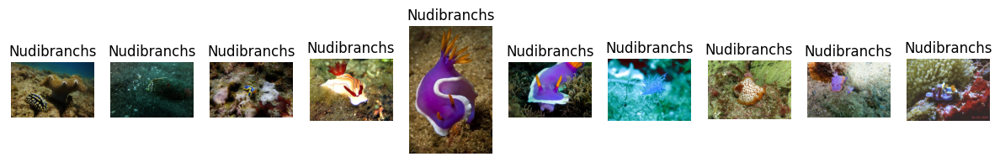

9


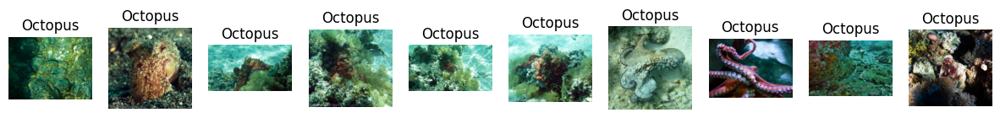

10


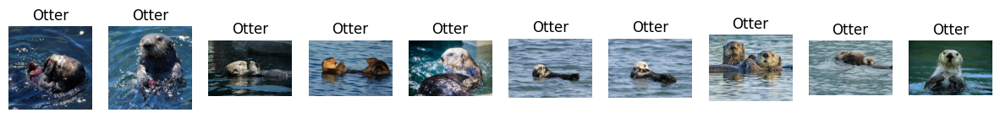

11


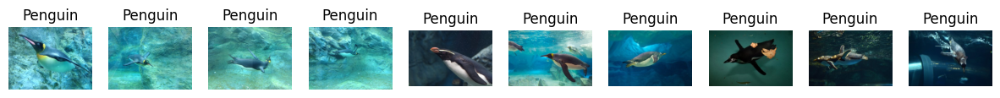

12


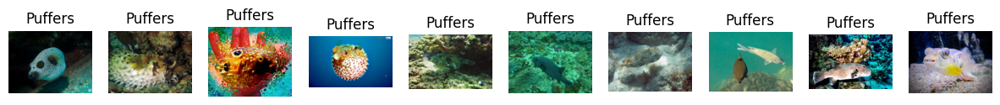

13


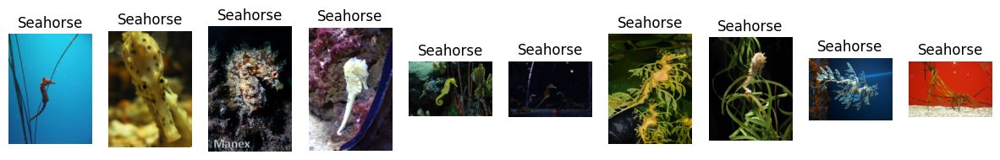

14


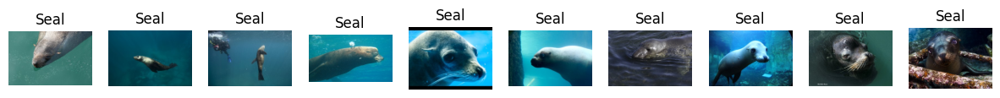

15


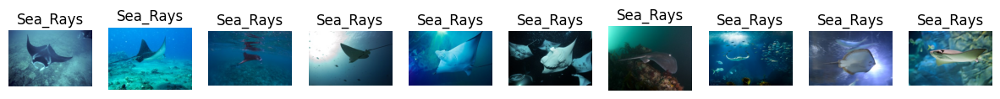

16


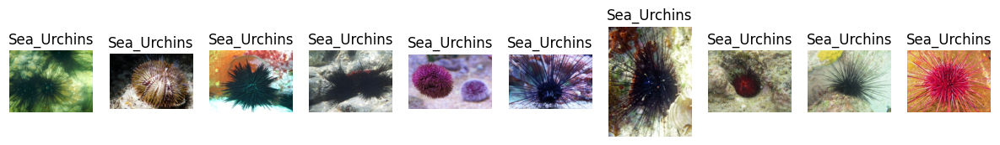

17


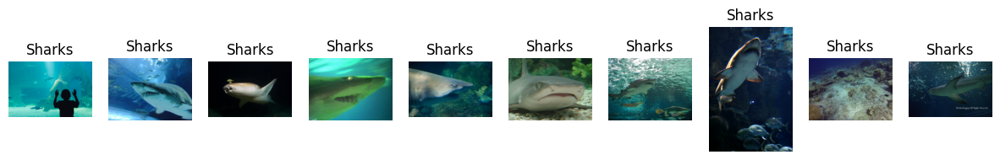

18


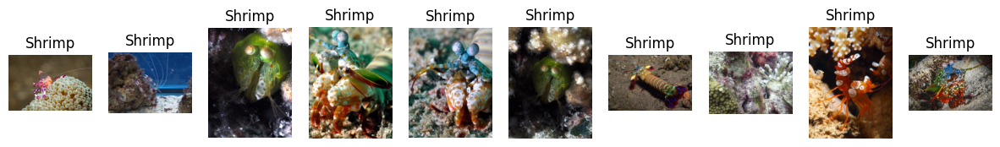

19


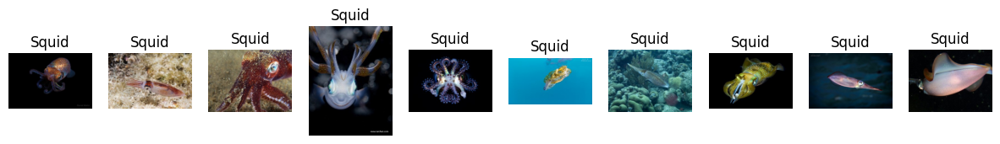

20


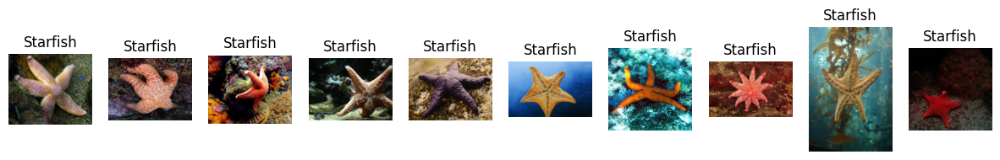

21


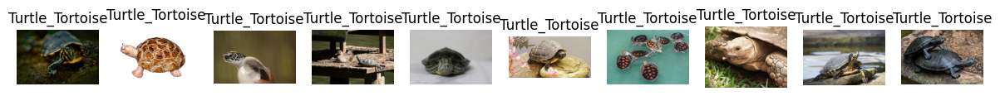

22


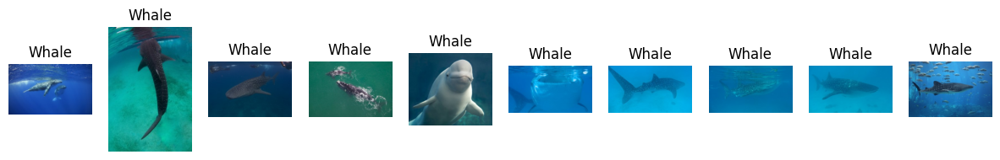

In [5]:
class_no = 0
for class_name in os.listdir(folder_path):
    print(class_no)
    print_data(class_name, folder_path, numOfImages=10)
    class_no+=1

In [6]:
#Load Data Function
def load_data_from_directory(directory, target_size, labels_mapping):
    images = []
    labels = []

    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        for img_name in os.listdir(class_path):
            img_path  = os.path.join(class_path, img_name)
            img       = load_img(img_path, target_size=target_size)
            img_array = img_to_array(img)
            images.append(img_array)
            labels.append(labels_mapping[class_name])
    return np.array(images), np.array(labels)

In [7]:
#Load Data Directly into RAM
x_data, y_data = load_data_from_directory(directory=folder_path,
                                          target_size=target_size,
                                          labels_mapping=labels_sea_animals)
#Train-Validation-Test Split 70%-15%-15%
X_train, X_temp, y_train, y_temp = train_test_split(x_data, y_data, test_size=0.3, random_state=42) # 70% train, 30% temp
X_val, X_test, y_val, y_test     = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42) # 15% validaton, 15% test

#One-Hot Encoding
num_of_classes = 23
y_train = to_categorical(y_train, num_of_classes)
y_val   = to_categorical(y_val  , num_of_classes)
y_test  = to_categorical(y_test , num_of_classes)

In [8]:
print("X_train shape: ", X_train.shape)
print("X_val shape: ", X_val.shape)
print("X_test shape: ", X_test.shape)

print("\ny_train shape: ", y_train.shape)
print("y_val shape: ", y_val.shape)
print("y_test shape: ", y_test.shape)

X_train shape:  (9509, 300, 300, 3)
X_val shape:  (2038, 300, 300, 3)
X_test shape:  (2038, 300, 300, 3)

y_train shape:  (9509, 23)
y_val shape:  (2038, 23)
y_test shape:  (2038, 23)


In [9]:
#Data Augmentation

#Train set
train_datagen = ImageDataGenerator(rescale            =1.0/255,#Normalization
                                   zoom_range         =0.2,
                                   width_shift_range  =0.2,
                                   height_shift_range =0.2,
                                   rotation_range     =40,
                                   shear_range        =0.2,
                                   horizontal_flip    =True,
                                   vertical_flip      =True,
                                   fill_mode          ="nearest")

#Test and Val set, no augmentation
test_datagen = ImageDataGenerator(rescale=1.0/255) #Normalizaton

In [10]:
train_generator = train_datagen.flow(X_train,
                                     y_train,
                                     batch_size=32,
                                     shuffle=True,
                                     seed=42)

val_generator   = test_datagen.flow (X_val,
                                     y_val,
                                     batch_size=32,
                                     shuffle=False,
                                     seed=42)

test_generator  = test_datagen.flow (X_test,
                                     y_test,
                                     batch_size=32,
                                     shuffle=False,
                                     seed=42)

In [11]:
#Testing one-hot encoding
print(labels_sea_animals_reversed)
for i in range(15):
    print(i, " - ", y_train[i], " - ", np.argmax(y_train[i]), " - ", labels_sea_animals_reversed[np.argmax(y_train[i])])

{0: 'Clams', 1: 'Corals', 2: 'Crabs', 3: 'Dolphin', 4: 'Eel', 5: 'Fish', 6: 'Jelly_Fish', 7: 'Lobster', 8: 'Nudibranchs', 9: 'Octopus', 10: 'Otter', 11: 'Penguin', 12: 'Puffers', 13: 'Sea_Rays', 14: 'Sea_Urchins', 15: 'Seahorse', 16: 'Seal', 17: 'Sharks', 18: 'Shrimp', 19: 'Squid', 20: 'Starfish', 21: 'Turtle_Tortoise', 22: 'Whale'}
0  -  [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]  -  1  -  Corals
1  -  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]  -  21  -  Turtle_Tortoise
2  -  [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]  -  7  -  Lobster
3  -  [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]  -  8  -  Nudibranchs
4  -  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]  -  14  -  Sea_Urchins
5  -  [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]  -  3  -  Dolphin
6  -  [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]  

## 2-) Data Visualization

------------Train Set------------


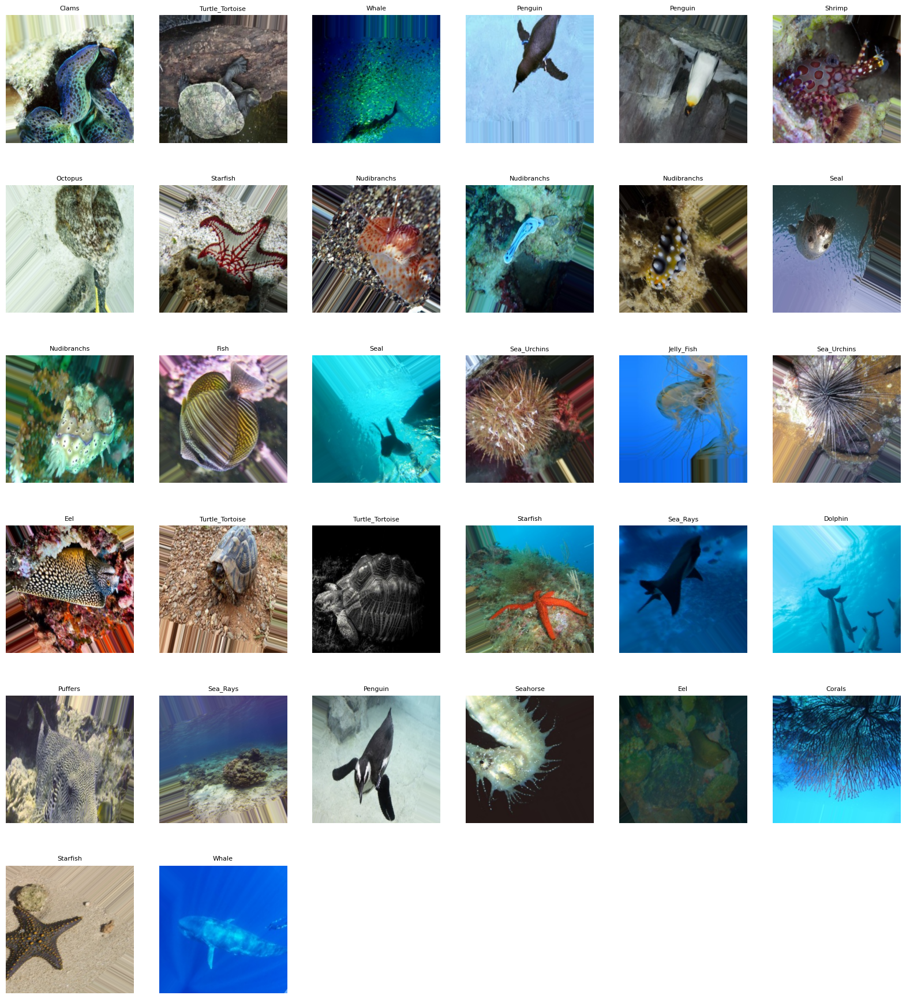

------------Validation Set------------


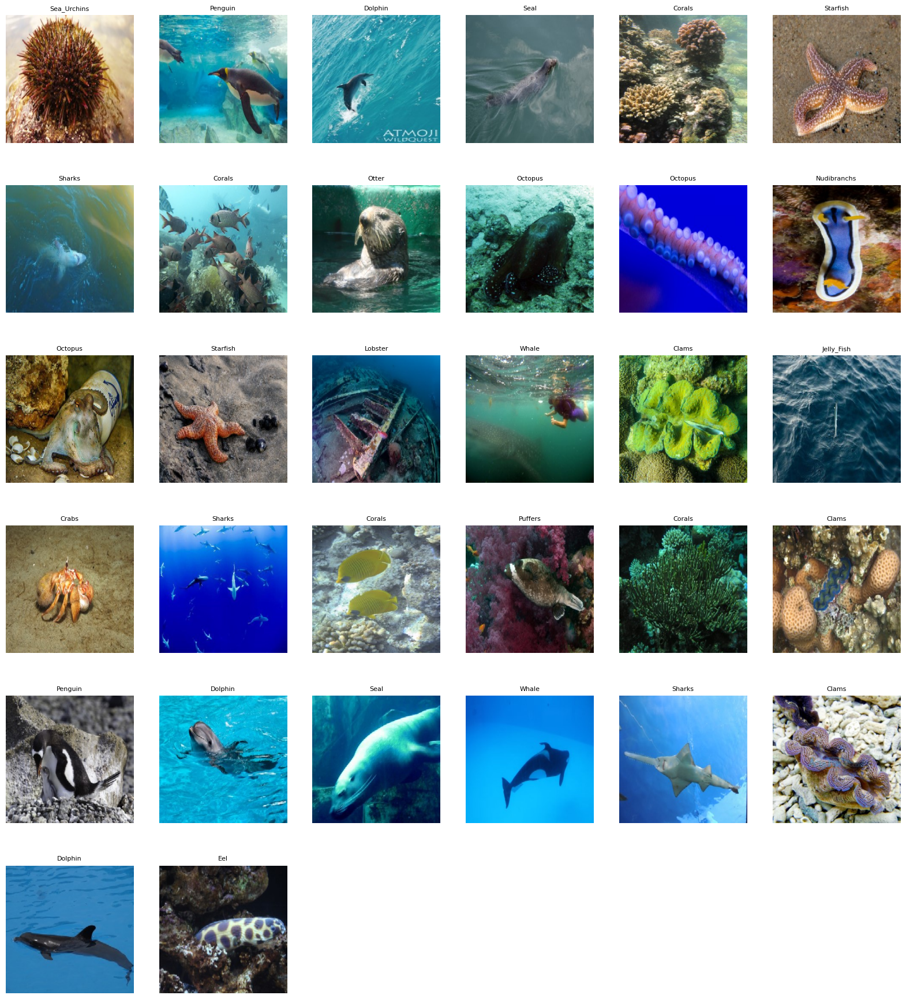

------------Test Set------------


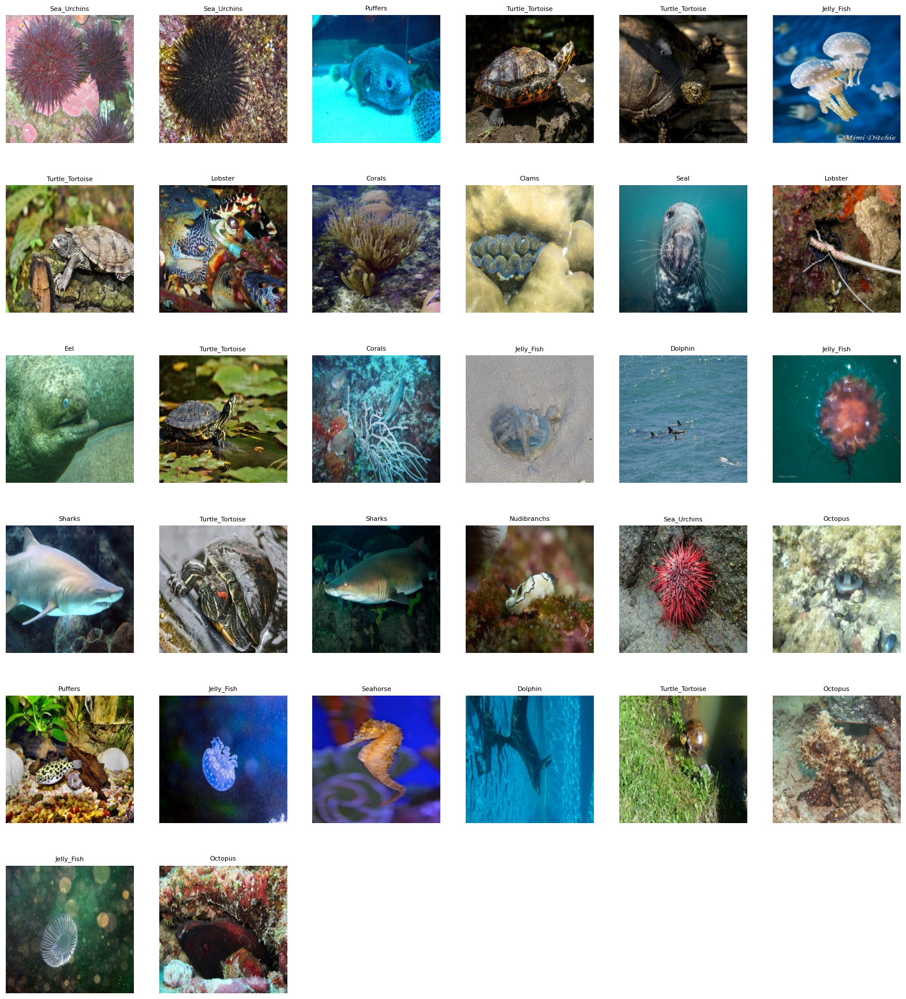

In [12]:
def visualize_image(generator, labels_reversed, num_images=100):
    generator.reset()
    image_batch, label_batch = next(generator)          #Get data from generator
    
    plt.figure(figsize=(20, 30))                        #Create window for figure
    for n in range(min(num_images, len(image_batch))):
        ax = plt.subplot(8, 6, n + 1)                   #To add multiple pictures into on
        # Show Imgs
        img_rescaled = (image_batch[n] * 255).astype('uint8') # rescale to 0-255
        plt.imshow(img_rescaled)                              # show img
        # Show Labels
        class_index = np.argmax(label_batch[n])   #Find label index from one-hot encoded
        class_name = labels_reversed[class_index] #Find label
        plt.title(class_name, fontsize=8) #Add label as title
        plt.axis("off")                   #Close Coordinate System
    plt.show()

print("------------Train Set------------")
visualize_image(generator       = train_generator, 
                labels_reversed = labels_sea_animals_reversed, 
                num_images      = 32)

print("------------Validation Set------------")
visualize_image(generator       = val_generator, 
                labels_reversed = labels_sea_animals_reversed, 
                num_images      = 32)

print("------------Test Set------------")
visualize_image(generator       = test_generator, 
                labels_reversed = labels_sea_animals_reversed, 
                num_images      = 32)

In [13]:
def extract_labels(generator):
    labels = []                                         #Empty list to store labels
    generator.reset()                                   #Reset generator
    for _ in range(len(generator)):                     
        _, label_batch = next(generator)                #Take a batch from generator
        labels.extend(np.argmax(label_batch,axis=1))    #Turn One-hot encoded labels into 1 dimensional and add to list
    return np.array(labels)                             #Turn list into numpy array

# Find labels
train_labels      = extract_labels(train_generator)
validation_labels = extract_labels(val_generator)
test_labels       = extract_labels(test_generator)


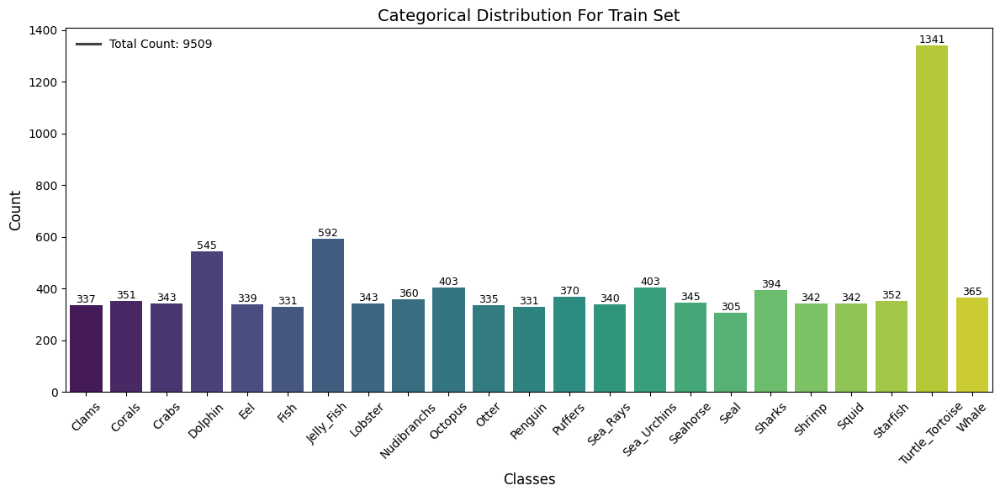

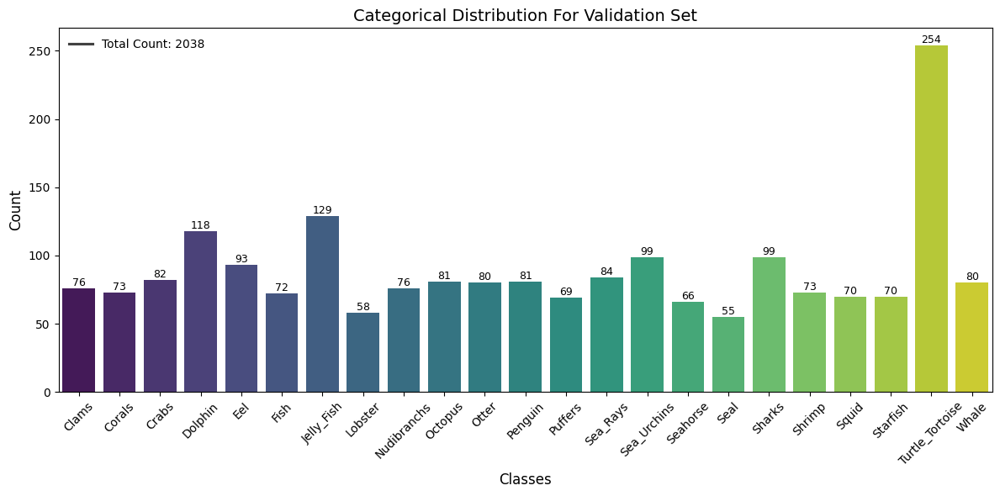

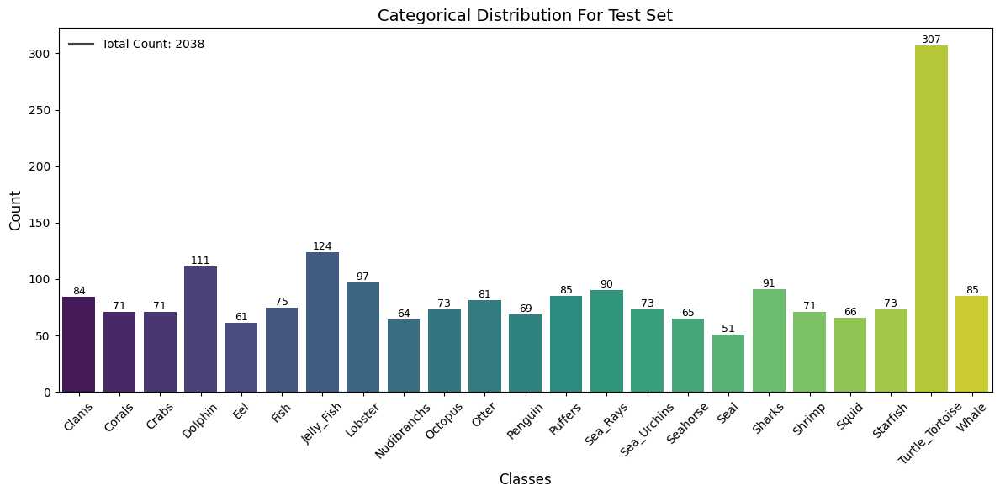

In [14]:
#Bar Plot
def plot_label_distribution(labels, title_name, reversed_labels):
    title                 = "Categorical Distribution For " + title_name        #Create title for graph
    unique_labels, counts = np.unique(labels, return_counts=True)               #Find unique labels(integers) and thier frequencies
    label_names_list      = [reversed_labels[label] for label in unique_labels] #Find names of unique_labels

    plt.figure(figsize=(12, 6))             #Size of graph
    bars = sns.barplot(x=label_names_list,  #Create BarGraph
                       y=counts, 
                       palette="viridis")

    # Add Quantity to every bar
    for bar, count in zip(bars.patches, counts):
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            f'{count}',
            ha='center',
            va='bottom',
            fontsize=9
        )

    plt.title(title, fontsize=14)       #Add Graph title
    plt.xlabel("Classes", fontsize=12)  #Add X label title
    plt.ylabel("Count", fontsize=12)    #Add Y label title
    plt.xticks(rotation=45)             #Rotate X labels 45 degree

    # Legend
    total_count = np.sum(counts)
    plt.legend(
        [f"Total Count: {total_count}"],
        loc="upper left",
        frameon=False,
        fontsize=10
    )

    plt.tight_layout()
    plt.show()

plot_label_distribution(labels          = train_labels, 
                        title_name      = "Train Set",
                        reversed_labels = labels_sea_animals_reversed)

plot_label_distribution(labels          = validation_labels, 
                        title_name      = "Validation Set",
                        reversed_labels = labels_sea_animals_reversed)

plot_label_distribution(labels          = test_labels, 
                        title_name      = "Test Set",
                        reversed_labels = labels_sea_animals_reversed)

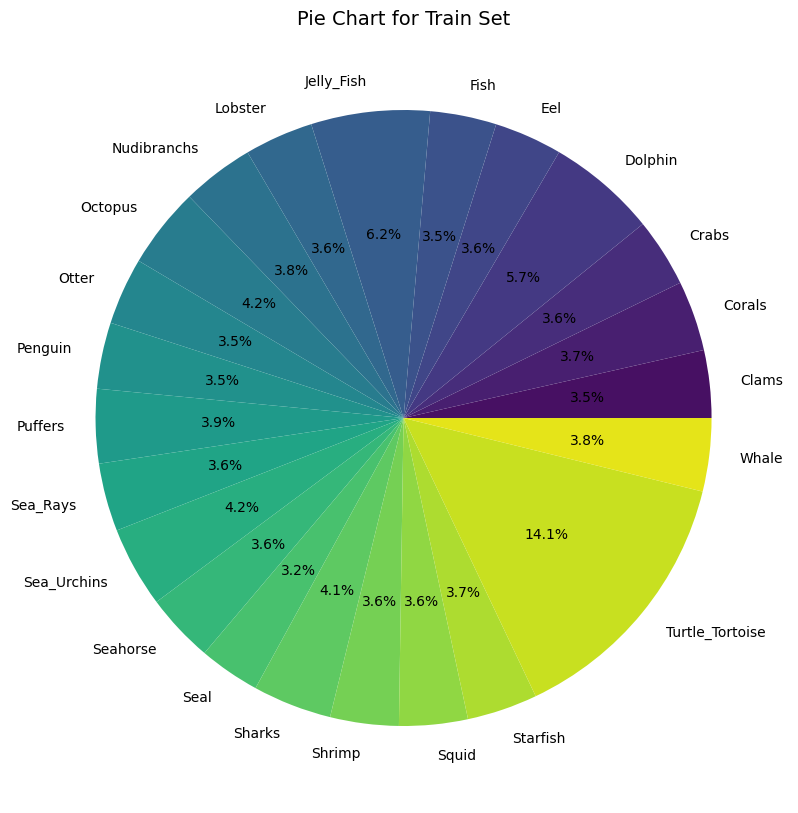

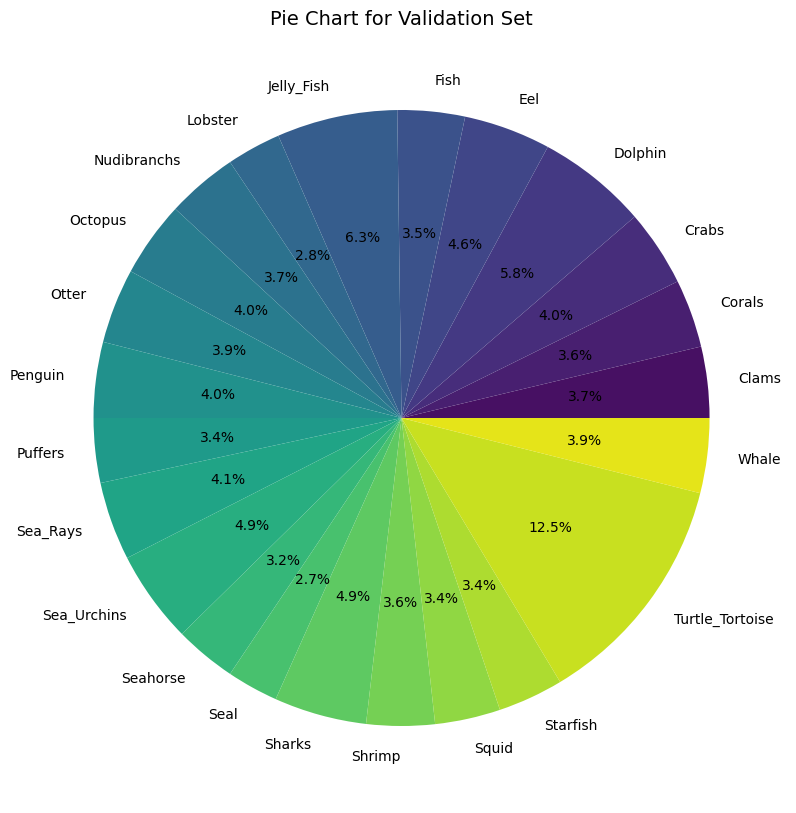

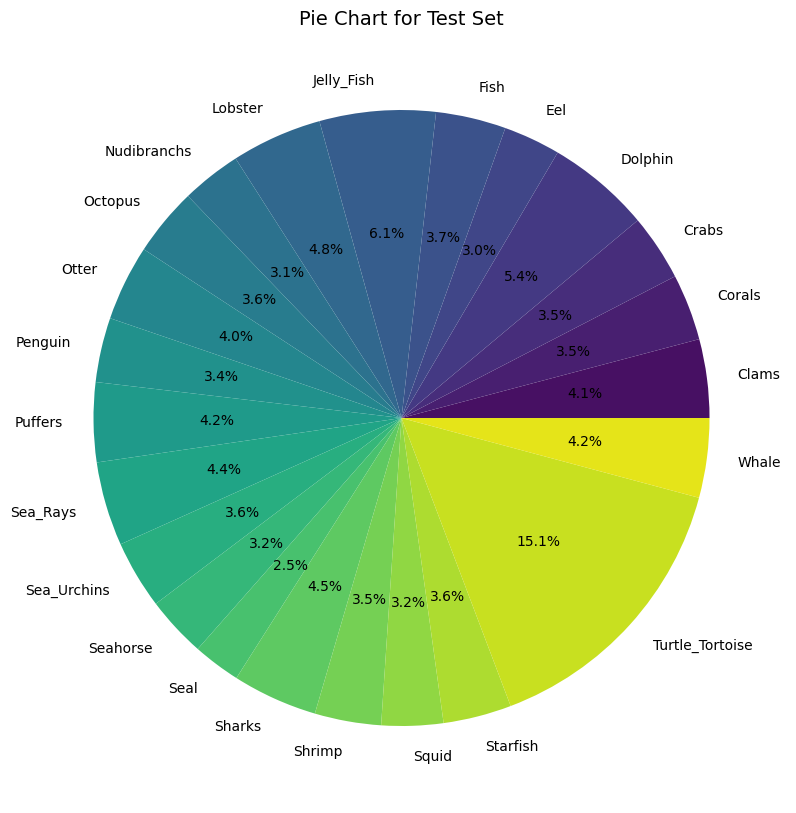

In [15]:
#Pie Chart
def plot_pie_chart(labels, title_name, reversed_labels):
    unique_labels, counts = np.unique(labels, return_counts=True)           #Find unique labels(integers) and thier frequencies
    label_names_list = [reversed_labels[label] for label in unique_labels]  #Find names of unique_labels
    plt.figure(figsize=(10, 10))
    plt.pie(counts, labels=label_names_list, autopct='%1.1f%%', colors=sns.color_palette("viridis", len(counts)))
    plt.title(f"Pie Chart for {title_name}", fontsize=14)
    plt.show()

plot_pie_chart(labels          = train_labels, 
               title_name      = "Train Set",
               reversed_labels = labels_sea_animals_reversed)

plot_pie_chart(labels          = validation_labels, 
               title_name      = "Validation Set",
               reversed_labels = labels_sea_animals_reversed)

plot_pie_chart(labels          = test_labels, 
               title_name      = "Test Set",
               reversed_labels = labels_sea_animals_reversed)

## 3-) Modeling

In [16]:
model = Sequential()

#Convolution Layer 1
model.add(Conv2D(filters     =32,
                 kernel_size =(3,3),
                 padding     ="same",
                 input_shape =(300,300,3),
                 activation  ="relu"))
#Batch Normalization Layer 1
model.add(BatchNormalization())
#Pooling Layer 1
model.add(MaxPooling2D(pool_size=2,
                       strides=(2,2)))
#Convolution Layer 2
model.add(Conv2D(filters     =64,
                 kernel_size =(3,3),
                 padding     ="same",
                 activation  ="relu"))
#Batch Normalization Layer 2
model.add(BatchNormalization())
#Pooling Layer 2
model.add(MaxPooling2D(pool_size=2,
                       strides=(2,2)))
#Convolution Layer 3
model.add(Conv2D(filters     =64,
                 kernel_size =(3,3),
                 padding     ="same",
                 activation  ="relu"))
#Batch Normalization Layer 3
model.add(BatchNormalization())
#Pooling Layer 3
model.add(MaxPooling2D(pool_size=2,
                       strides=(2,2)))
#Flatten layer
model.add(Flatten())
#Dense Layer 1
model.add(Dense(units=512,
                activation="relu"))
#Batch Normalization Layer 7
model.add(BatchNormalization())
#Dense Layer 2
model.add(Dense(units=512,
                activation="relu"))
#Batch Normalization Layer 8
model.add(BatchNormalization())
#Dropout Layer 1
model.add(Dropout(rate=0.5))
#Dense Layer 3
model.add(Dense(units=1024,
                activation="relu"))
#Batch Normalization Layer 9
model.add(BatchNormalization())
#Output Layer
model.add(Dense(units=23,
                activation="softmax"))#Multi-class classification

In [17]:
model.compile(loss      = "categorical_crossentropy",       #For multi-class classification.
              optimizer = "adam",                           #Fast And Efficient.
              metrics   = [tf.keras.metrics.Precision(),    #Precission, recall, accuracy.
                           tf.keras.metrics.Recall(),
                           "accuracy"])

In [18]:
#To prevent Overfitting

callbacks = [EarlyStopping(monitor  = "val_loss", #Target Metric
                           patience = 15,         #Control every 15 epoch.
                           verbose  = 1,          #Show Information
                           mode     = "min"),     #Stop, if val_loss cannot decrease.
             #Save Best Model
             ModelCheckpoint(filepath           = "BestModel_Regular_CNN.keras",  #name
                             monitor            = "val_loss",                     #Target Metric
                             mode               = "min",                          #Decrase
                             save_best_only     = True,                           #Save best model
                             save_weights_only  = False),                         #Save all model/Save only weights
             #Save Every 25 epoch
             ModelCheckpoint(filepath='model_Regular_CNN_epoch_{epoch:02d}.keras',            #name
                             save_freq=25 * train_generator.n // train_generator.batch_size)] #Save per 25 epoch

In [19]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 300, 300, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 300, 300, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 150, 150, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 150, 150, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 150, 150, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 75, 75, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 87616)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    44,859,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1024)           │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 23)             │        23,575 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 45,736,599 (174.47 MB)

 Trainable params: 45,732,183 (174.45 MB)

 Non-trainable params: 4,416 (17.25 KB)

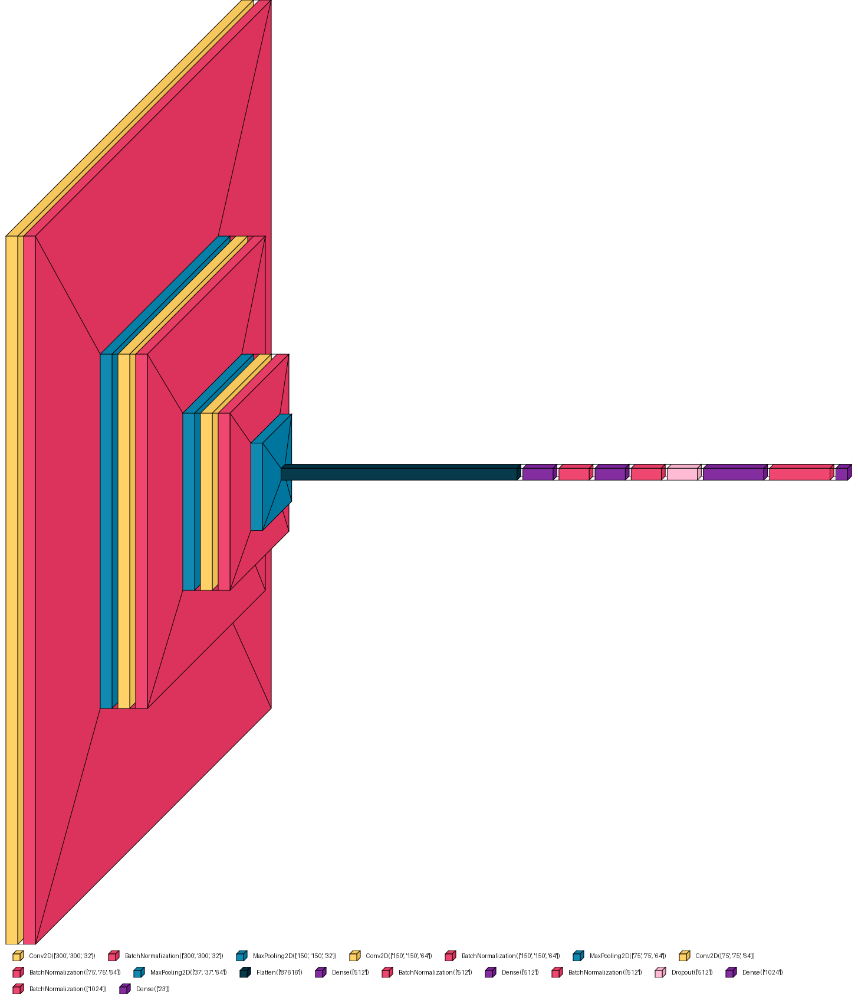

In [20]:
visualkeras.layered_view(model, legend=True, show_dimension=True)

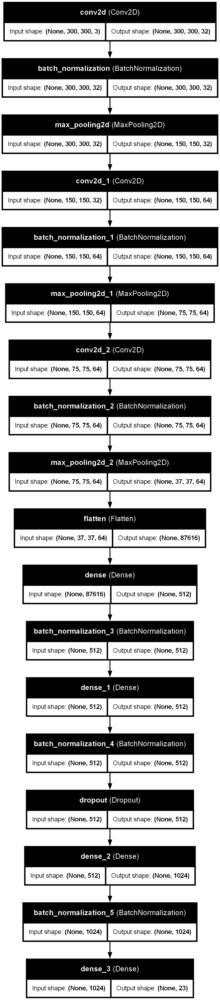

In [22]:
from IPython.display import Image
os.environ["PATH"] += os.pathsep + r"C:\Program Files\Graphviz\bin"

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)
Image(filename='model_plot.png')

In [23]:
print("Train generator samples:", len(train_generator))
print("Validation generator samples:", len(val_generator))

Train generator samples: 298
Validation generator samples: 64


In [24]:
# Training the Model
history = model.fit(train_generator,                       #Train Set
                    epochs=1000,                           #Train for 1000 Epoch
                    callbacks=callbacks,                   #Early Stopping and ModelCheckPoints
                    validation_data=val_generator,         #Validation Set
                    steps_per_epoch=len(train_generator),  #Steps per epoch
                    validation_steps=len(val_generator)    #Steps per validation epoch
)

Epoch 1/1000
298/298 ━━━━━━━━━━━━━━━━━━━━ 480s 2s/step - accuracy: 0.1554 - loss: 3.3311 - precision: 0.2469 - recall: 0.0559 - val_accuracy: 0.0824 - val_loss: 3.6557 - val_precision: 0.1325 - val_recall: 0.0162
Epoch 2/1000
298/298 ━━━━━━━━━━━━━━━━━━━━ 485s 2s/step - accuracy: 0.2336 - loss: 2.7098 - precision: 0.4202 - recall: 0.0713 - val_accuracy: 0.2610 - val_loss: 2.6050 - val_precision: 0.4627 - val_recall: 0.1369
Epoch 3/1000
298/298 ━━━━━━━━━━━━━━━━━━━━ 479s 2s/step - accuracy: 0.2503 - loss: 2.5387 - precision: 0.4951 - recall: 0.0959 - val_accuracy: 0.2483 - val_loss: 2.9796 - val_precision: 0.3408 - val_recall: 0.1349
Epoch 4/1000
298/298 ━━━━━━━━━━━━━━━━━━━━ 480s 2s/step - accuracy: 0.2745 - loss: 2.4621 - precision: 0.5564 - recall: 0.1116 - val_accuracy: 0.1511 - val_loss: 3.3890 - val_precision: 0.2777 - val_recall: 0.0628
Epoch 5/1000
298/298 ━━━━━━━━━━━━━━━━━━━━ 480s 2s/step - accuracy: 0.2795 - loss: 2.4316 - precision: 0.5667 - recall: 0.1122 - val_accuracy: 0.2620

In [25]:
best_epoch = np.argmin(history.history['val_loss']) + 1  # +1 to adjust for zero-indexing
best_val_loss = min(history.history['val_loss'])
print(f"Best epoch: {best_epoch}")
print(f"Validation loss of Best Epoch: {best_val_loss:.4f}")

Best epoch: 63
Validation loss of Best Epoch: 1.6105


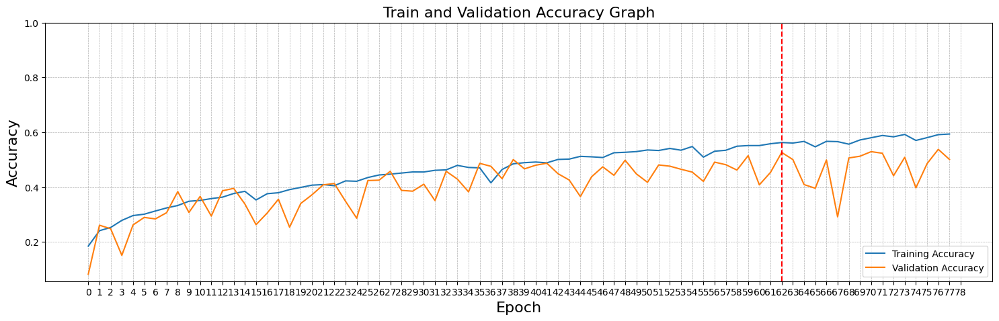

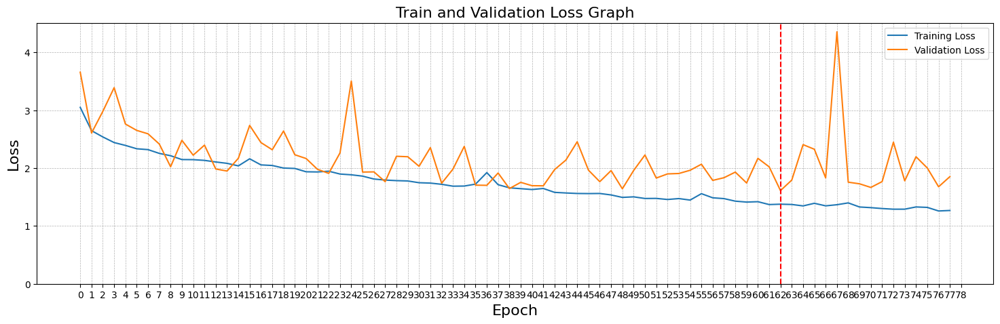

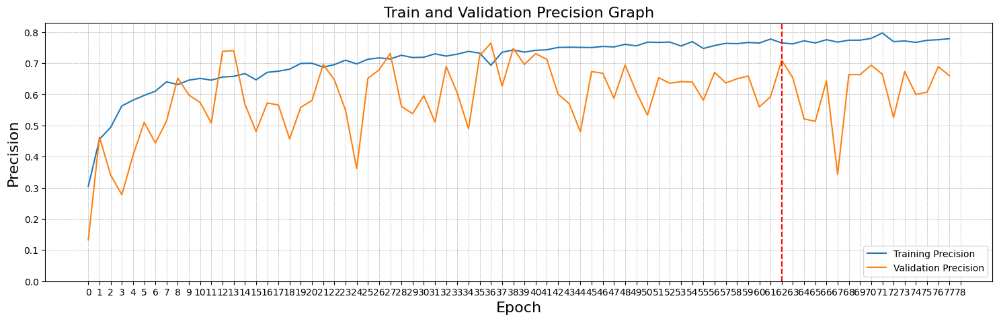

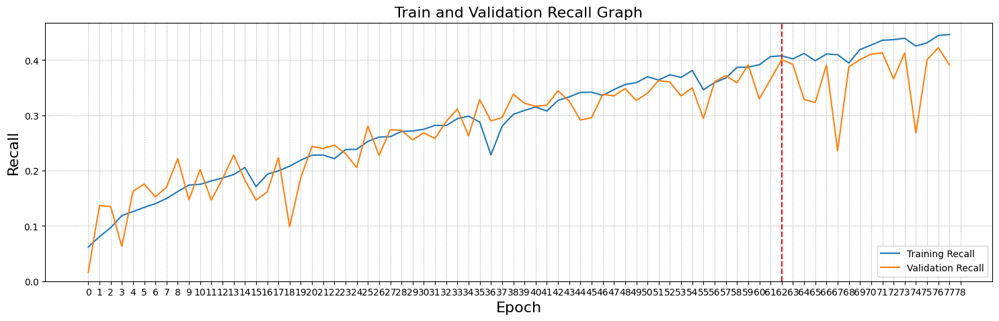

In [35]:
#------------------Epoch vs Accuracy------------------
plt.figure(figsize=(40,5))
plt.subplot(1,2,1)
plt.plot(history.history["accuracy"], label="Training Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.legend(loc="lower right")
plt.axvline(x=62, color='r', linestyle='--', label='Epoch 63')
plt.xticks(range(0, 79))
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Accuracy", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.ylim([min(plt.ylim()),1])
plt.title("Train and Validation Accuracy Graph", fontsize=16)
#------------------Epoch vs Loss------------------
plt.figure(figsize=(40,5))
plt.subplot(1,2,2)
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend(loc="upper right")
plt.axvline(x=62, color='r', linestyle='--', label='Epoch 63')
plt.xticks(range(0, 79))
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Loss", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.ylim([0,max(plt.ylim())])
plt.title("Train and Validation Loss Graph", fontsize=16)
plt.show()
#------------------Epoch vs Precision------------------
plt.figure(figsize=(40,5))
plt.subplot(1,2,2)
plt.plot(history.history["precision"], label="Training Precision")
plt.plot(history.history["val_precision"], label="Validation Precision")
plt.legend(loc="lower right")
plt.axvline(x=62, color='r', linestyle='--', label='Epoch 63')
plt.xticks(range(0, 79))
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Precision", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.ylim([0,max(plt.ylim())])
plt.title("Train and Validation Precision Graph", fontsize=16)
plt.show()
#------------------Epoch vs Recall------------------
plt.figure(figsize=(40,5))
plt.subplot(1,2,2)
plt.plot(history.history["recall"], label="Training Recall")
plt.plot(history.history["val_recall"], label="Validation Recall")
plt.legend(loc="lower right")
plt.axvline(x=62, color='r', linestyle='--', label='Epoch 63')
plt.xticks(range(0, 79))
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Recall", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.ylim([0,max(plt.ylim())])
plt.title("Train and Validation Recall Graph", fontsize=16)
plt.show()

In [27]:
#Pandas settings for demonstrating all rows and columns.
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

#Save df
history_df = pd.DataFrame(history.history)
history_df["Epoch"] = history_df.index+1
history_df.to_csv("Model_Training_History_Regular_CNN.csv", index=False)

#Show df
history_df = pd.read_csv("Model_Training_History_Regular_CNN.csv")
history_df

,accuracy,loss,precision,recall,val_accuracy,val_loss,val_precision,val_recall,Epoch
0,0.184877,3.048293,0.304663,0.061836,0.082434,3.655664,0.132530,0.016192,1
1,0.241140,2.645990,0.455952,0.080555,0.261040,2.605001,0.462687,0.136899,2
2,0.252813,2.537589,0.493827,0.096750,0.248283,2.979579,0.340768,0.134936,3
3,0.278683,2.440628,0.562812,0.118730,0.151129,3.389044,0.277657,0.062807,4
4,0.296246,2.391305,0.581271,0.125986,0.262022,2.760396,0.403893,0.162905,5
5,0.301294,2.333367,0.596524,0.133558,0.289500,2.650823,0.509971,0.175662,6
6,0.312967,2.318566,0.610247,0.140288,0.284102,2.591817,0.443652,0.152601,7
7,0.324114,2.253441,0.640126,0.149648,0.306673,2.414871,0.514837,0.170265,8
8,0.332948,2.213241,0.631191,0.162162,0.383710,2.022874,0.652237,0.221786,9
9,0.348512,2.146810,0.645589,0.173940,0.307655,2.479479,0.597610,0.147203,10


In [28]:
print("GPU list:", tf.config.list_physical_devices('GPU'))

print("Is TensorFlow using GPU: ", tf.test.is_gpu_available())

GPU list: []
Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
Is TensorFlow using GPU:  False


this model will get fixed in the future with gpu support.

In [34]:
history_df.loc[history_df["Epoch"]==63]

,accuracy,loss,precision,recall,val_accuracy,val_loss,val_precision,val_recall,Epoch
62,0.56273,1.375787,0.765147,0.407719,0.526497,1.610547,0.709818,0.400883,63
